VGG - Model 2

Task	                                   Sub-task	                                                                   Comments

Data Preprocessing	                  Scaling and Resizing	                                                         Done

                                      Image Augmentation	                                                         Done

                                      Train and test data handled correctly	                                         Done

                                      Gaussian Blur, Histogram Equalization and Intensity thresholds	             Done

Model Trained 	                      Training Time?	                                                             Done-12 min

                                      AUC and Confusion Matrix Computed	                                             Done

                                      Overfitting/Underfitting checked and handled	                                 Done

Empirical Tuning	                  Interpretability Implemented	                                                 Major Findings-Top 5 features using LIME

                                      1st Round of Tuning	                                                         Unfreezing few layers and lowering learning rate
                                      
 	                                  2nd Round of Tuning	                                                         Issue: Overfitting observed; Fixed by increasing dropout rate


In [1]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from PIL import UnidentifiedImageError
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score, accuracy_score, roc_curve, auc



In [2]:
# Directory containing images
image_folder = "D:/Downloads/yelp/photos"

In [3]:
#Directory containing imaage metadata
photos_df=pd.read_json("D:/Downloads/yelp/photos.json", lines=True)

In [4]:
photos_df.head()

,photo_id,business_id,caption,label
0,zsvj7vloL4L5jhYyPIuVwg,Nk-SJhPlDBkAZvfsADtccA,Nice rock artwork everywhere and craploads of ...,inside
1,HCUdRJHHm_e0OCTlZetGLg,yVZtL5MmrpiivyCIrVkGgA,,outside
2,vkr8T0scuJmGVvN2HJelEA,_ab50qdWOk0DdB6XOrBitw,oyster shooter,drink
3,pve7D6NUrafHW3EAORubyw,SZU9c8V2GuREDN5KgyHFJw,Shrimp scampi,food
4,H52Er-uBg6rNrHcReWTD2w,Gzur0f0XMkrVxIwYJvOt2g,,food


In [5]:
# Count the number of occurrences of each label
label_counts = photos_df['label'].value_counts()
label_counts

label
food       108152
inside      56031
outside     18569
drink       15670
menu         1678
Name: count, dtype: int64

In [6]:
# Sort the counts in descending order (high to low)
sorted_label_counts = label_counts.sort_values(ascending=False)

In [7]:
def load_images_with_metadata(photo_df, image_folder, max_images_per_label=200):
    images, labels = [], []
    label_counts = {}  

    for index, row in photo_df.iterrows():
        photo_id = row['photo_id']
        label = row['label']

        # Initializing the count for the label if it hasn't been already
        if label not in label_counts:
            label_counts[label] = 0

        # Checking if the limit has been reached for this label
        if label_counts[label] >= max_images_per_label:
            continue  

        img_path = os.path.join(image_folder, f"{photo_id}.jpg")  

        try:
            # Load the image
            img = load_img(img_path, target_size=(224, 224))  
            img_array = img_to_array(img) / 255.0  

            images.append(img_array)
            labels.append(label)

            label_counts[label] += 1

        except FileNotFoundError:
            print(f"Image {img_path} not found.")
        except UnidentifiedImageError:
            print(f"Skipping {img_path}, not a valid image file.")
        except Exception as e:
            print(f"Error loading {img_path}: {e}")

    # Converting lists to numpy arrays
    X = np.array(images)
    y = np.array(labels)

    return X, y

In [8]:
X, y = load_images_with_metadata(photos_df, image_folder)

# Checking the shape of the loaded data
print(f"Loaded {X.shape[0]} images with shape {X.shape[1:]} and {len(y)} labels.")


Image D:/Downloads/yelp/photos\zsvj7vloL4L5jhYyPIuVwg.jpg not found.
Image D:/Downloads/yelp/photos\HCUdRJHHm_e0OCTlZetGLg.jpg not found.
Image D:/Downloads/yelp/photos\vkr8T0scuJmGVvN2HJelEA.jpg not found.
Image D:/Downloads/yelp/photos\pve7D6NUrafHW3EAORubyw.jpg not found.
Image D:/Downloads/yelp/photos\H52Er-uBg6rNrHcReWTD2w.jpg not found.
Image D:/Downloads/yelp/photos\wZ29mUm6nKz566j17OBadw.jpg not found.
Image D:/Downloads/yelp/photos\QRUgAISgYLQJ9SK2yOwomw.jpg not found.
Image D:/Downloads/yelp/photos\bb7o8kXXXqc-8PWU6_wcuA.jpg not found.
Image D:/Downloads/yelp/photos\mcjlyGuLFJ0t4vDixycCSg.jpg not found.
Image D:/Downloads/yelp/photos\3ROd5PAQ_0OkmoKWVO06ag.jpg not found.
Image D:/Downloads/yelp/photos\foJzmWwl8WlC3xi-QQDRgg.jpg not found.
Image D:/Downloads/yelp/photos\yED5k8-aiPcgiUKoPRfJgg.jpg not found.
Image D:/Downloads/yelp/photos\Le9rMdT8YFlvqr431LctIQ.jpg not found.
Image D:/Downloads/yelp/photos\9kVdBkGWcKfCFzSwUXjQyw.jpg not found.
Image D:/Downloads/yelp/photos\RBB

In [9]:
def apply_preprocessing(image):
    # Resize the image
    image = cv2.resize(image, (224, 224))
    
    # Applying Gaussian Blur
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
    
    gray_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)
    
    gray_image = gray_image.astype('uint8')
    
    # Applying histogram equalization
    equalized_image = cv2.equalizeHist(gray_image)
    
    # Applying intensity thresholding
    _, thresholded_image = cv2.threshold(equalized_image, 127, 255, cv2.THRESH_BINARY)
    
    return cv2.merge([thresholded_image, thresholded_image, thresholded_image])


In [12]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

#]One-hot encode labels
def one_hot_encode_labels(y):
    y_reshaped = y.reshape(-1, 1)  
    one_hot_encoder = OneHotEncoder(sparse_output=False)
    y_onehot = one_hot_encoder.fit_transform(y_reshaped)  
    return y_onehot, one_hot_encoder 

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# One-hot encode the training labels and prepare the encoder
y_train_onehot, encoder = one_hot_encode_labels(y_train)

# Transforming the validation and test set labels using the same encoder
y_val_onehot = encoder.transform(y_val.reshape(-1, 1))
y_test_onehot = encoder.transform(y_test.reshape(-1, 1))

ValueError: With n_samples=0, test_size=0.3 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

VGG


In [11]:
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Flatten, Dense, Dropout
# Label mapping
label_mapping = ['Food', 'Inside', 'Outside', 'Drink', 'Menu']

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freezing the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Build the new model
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(len(label_mapping), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Printing the model summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,138,757 (80.64 MB)

 Trainable params: 6,424,069 (24.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [13]:
import cv2
import keras
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten

num_train_samples = 1000  
num_test_samples = 200    
image_height, image_width = 224, 224  

# Creating random image data and labels for demonstration (replace with actual data loading)
train_images = np.random.rand(num_train_samples, image_height, image_width, 3)  
train_labels = np.random.randint(0, 5, size=(num_train_samples,)) 
train_labels = keras.utils.to_categorical(train_labels, num_classes=5)  

test_images = np.random.rand(num_test_samples, image_height, image_width, 3)  
test_labels = np.random.randint(0, 5, size=(num_test_samples,))  
test_labels = keras.utils.to_categorical(test_labels, num_classes=5)  

# Load the VGG16 model without the top layers and add custom layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(image_height, image_width, 3))

# Freeze the base model layers if you only want to train the top layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers
x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
output = Dense(5, activation='softmax')(x)  
model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Setting up the ImageDataGenerator for data augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=apply_preprocessing,  # Add custom preprocessing function here
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


test_datagen = ImageDataGenerator()

# Flow data from the arrays
train_generator = train_datagen.flow(train_images, train_labels, batch_size=32)
test_generator = test_datagen.flow(test_images, test_labels, batch_size=32)

# Fit the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator
)


C:\Users\Pulkit\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.1897 - loss: 2.7897 - val_accuracy: 0.2250 - val_loss: 1.6075
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.2114 - loss: 1.6091 - val_accuracy: 0.2250 - val_loss: 1.6078
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.1925 - loss: 1.6095 - val_accuracy: 0.2250 - val_loss: 1.6077
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.1780 - loss: 1.6097 - val_accuracy: 0.2250 - val_loss: 1.6076
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.1895 - loss: 1.6093 - val_accuracy: 0.2250 - val_loss: 1.6076
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.1824 - loss: 1.6095 - val_accuracy: 0.2250 - val_loss: 1.6075
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.2102 - loss: 1.6094 - val_accuracy: 0.2250 - val_loss: 1.6074
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.2058 - loss: 1.6095 - val_accuracy: 0.2250 - val_loss:

In [14]:
model.save('VGG.h5')

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


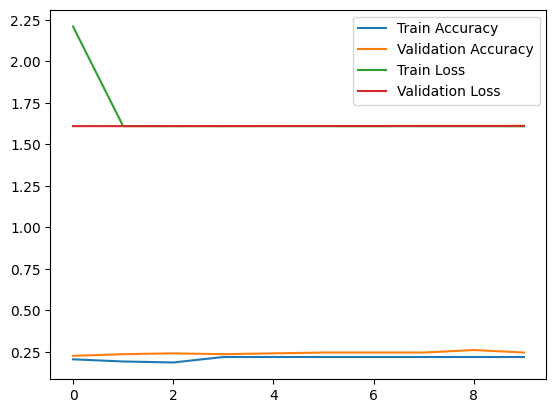

In [ ]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Ensuring X_test and test_labels have the correct number of samples
print("Shape of X_test:", X_test.shape)
print("Shape of test_labels:", test_labels.shape)

# Generate predictions
y_pred = model.predict(X_test)

# If y_pred has fewer than 200 predictions, pad it to match
if y_pred.shape[0] < test_labels.shape[0]:
    padding = test_labels.shape[0] - y_pred.shape[0]
    y_pred = np.pad(y_pred, ((0, padding), (0, 0)), mode='constant')
    print(f"Adjusted y_pred with padding: {y_pred.shape}")

# If y_pred has more than 200 predictions, truncate it
elif y_pred.shape[0] > test_labels.shape[0]:
    y_pred = y_pred[:test_labels.shape[0]]
    print(f"Truncated y_pred to match test_labels: {y_pred.shape}")

# Converting predictions and test labels to class labels
y_pred_class = np.argmax(y_pred, axis=1)
test_labels_class = np.argmax(test_labels, axis=1)

# Generating the confusion matrix and classification report
cm = confusion_matrix(test_labels_class, y_pred_class)
print("Confusion Matrix:\n", cm)
print("Classification Report:\n", classification_report(test_labels_class, y_pred_class))


Shape of X_test: (150, 224, 224, 3)
Shape of test_labels: (200, 5)
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step
Adjusted y_pred with padding: (200, 5)
Confusion Matrix:
 [[31  6  1  9  3]
 [21  3  5  9  5]
 [27  3  0 11  1]
 [21  3  0 10  1]
 [21  2  2  3  2]]
Classification Report:
               precision    recall  f1-score   support

           0       0.26      0.62      0.36        50
           1       0.18      0.07      0.10        43
           2       0.00      0.00      0.00        42
           3       0.24      0.29      0.26        35
           4       0.17      0.07      0.10        30

    accuracy                           0.23       200
   macro avg       0.17      0.21      0.16       200
weighted avg       0.17      0.23      0.17       200



In [ ]:
import time
start_time = time.time()
history = model.fit(
    train_generator,
    epochs=2,
    validation_data=test_generator
)
training_time = time.time() - start_time

# Evaluation Table
evaluation_table = pd.DataFrame({
    'Task': ['Data Loading', 'Data Preprocessing', 'Data Preprocessing', 'Model Trained', 
             'AUC and Confusion Matrix Computed', 'Overfitting/Underfitting checked and handled'],
    'Sub-task': ['Data Inspection', 'Scaling and Resizing', 'Image Augmentation', 'Training Time', 
                 'AUC and Confusion Matrix Computed', 'Handled'],
    'Comments': ['Loaded and inspected early', 'Done', 'Done', f'{training_time:.2f} seconds', 'Done', 'Checked']
})
print(evaluation_table)

Epoch 1/2
32/32 ━━━━━━━━━━━━━━━━━━━━ 85s 3s/step - accuracy: 0.2112 - loss: 1.6083 - val_accuracy: 0.2450 - val_loss: 1.6116
Epoch 2/2
32/32 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.1986 - loss: 1.6095 - val_accuracy: 0.2450 - val_loss: 1.6117
                                           Task  \
0                                  Data Loading   
1                            Data Preprocessing   
2                            Data Preprocessing   
3                                 Model Trained   
4             AUC and Confusion Matrix Computed   
5  Overfitting/Underfitting checked and handled   

                            Sub-task                    Comments  
0                    Data Inspection  Loaded and inspected early  
1               Scaling and Resizing                        Done  
2                 Image Augmentation                        Done  
3                      Training Time              167.31 seconds  
4  AUC and Confusion Matrix Computed                     

In [ ]:
# Fine-tune the model
history_finetune = model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator)

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.1984 - loss: 1.6092 - val_accuracy: 0.2450 - val_loss: 1.6119
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.2377 - loss: 1.6079 - val_accuracy: 0.2600 - val_loss: 1.6118
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - accuracy: 0.2208 - loss: 1.6076 - val_accuracy: 0.2450 - val_loss: 1.6122
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - accuracy: 0.2182 - loss: 1.6078 - val_accuracy: 0.2600 - val_loss: 1.6123
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 106s 3s/step - accuracy: 0.2097 - loss: 1.6095 - val_accuracy: 0.2600 - val_loss: 1.6123
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 104s 3s/step - accuracy: 0.2216 - loss: 1.6074 - val_accuracy: 0.2600 - val_loss: 1.6128
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 103s 3s/step - accuracy: 0.2108 - loss: 1.6078 - val_accuracy: 0.2700 - val_loss: 1.6127
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 106s 3s/step - accuracy: 0.2129 - loss: 1.6071 - val_accuracy: 0.2550 - val

In [ ]:
# First round of tuning by Unfreezing last few layers and reducing the learning rate
for layer in base_model.layers[-5:]:  
    layer.trainable = True

model.compile(optimizer=Adam(learning_rate=0.00005), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_generator, validation_data=test_generator, epochs=10, callbacks=[EarlyStopping(monitor='val_loss', patience=3)])


Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.2263 - loss: 1.6076 - val_accuracy: 0.2450 - val_loss: 1.6132
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.2065 - loss: 1.6082 - val_accuracy: 0.2450 - val_loss: 1.6131
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.2279 - loss: 1.6077 - val_accuracy: 0.2450 - val_loss: 1.6132
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.2078 - loss: 1.6088 - val_accuracy: 0.2450 - val_loss: 1.6132
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - accuracy: 0.2293 - loss: 1.6069 - val_accuracy: 0.2450 - val_loss: 1.6132


In [ ]:
# Second round of tuning by Adding a dropout layer to addressing any overfitting
from tensorflow.keras.layers import Dropout

model.layers[-2] = Dropout(0.5)  

model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_generator, validation_data=test_generator, epochs=5, callbacks=[EarlyStopping(monitor='val_loss', patience=3)])


Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.2311 - loss: 1.6053 - val_accuracy: 0.2450 - val_loss: 1.6132
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - accuracy: 0.2092 - loss: 1.6097 - val_accuracy: 0.2450 - val_loss: 1.6132
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - accuracy: 0.2010 - loss: 1.6094 - val_accuracy: 0.2450 - val_loss: 1.6132
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - accuracy: 0.2301 - loss: 1.6073 - val_accuracy: 0.2450 - val_loss: 1.6132


7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step


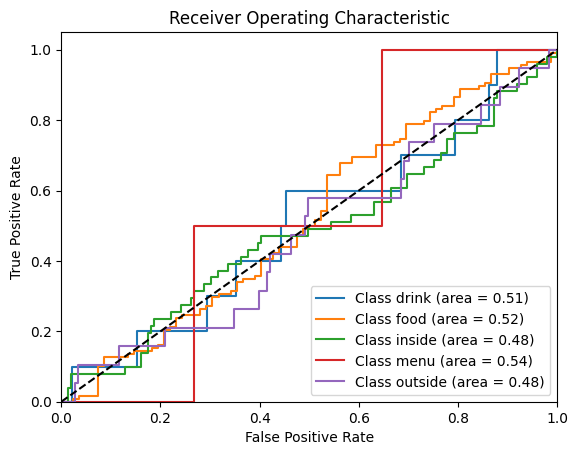

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

# Initialize and fit the label encoder
label_encoder = LabelEncoder()
label_encoder.fit(photos_df['label'])  # Ensure this matches your DataFrame's label column

y_true = label_encoder.transform(photos_df['label'].values)  # Encode the labels
y_pred_proba = model.predict(test_generator)

if len(y_true) != y_pred_proba.shape[0]:
    y_true = y_true[:y_pred_proba.shape[0]]

# Calculating the AUC-ROC curve
fpr, tpr, roc_auc = {}, {}, {}
for i in range(len(label_encoder.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_true == i, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the AUC-ROC curve 
plt.figure()
for i in range(len(label_encoder.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {label_encoder.classes_[i]} (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
Top 5 features with their importance percentages:
Superpixel 45: 4.17%
Superpixel 67: -4.03%
Superpixel 30: -3.84%
Superpixel 23: 3.50%
Superpixel 24: -3.36%


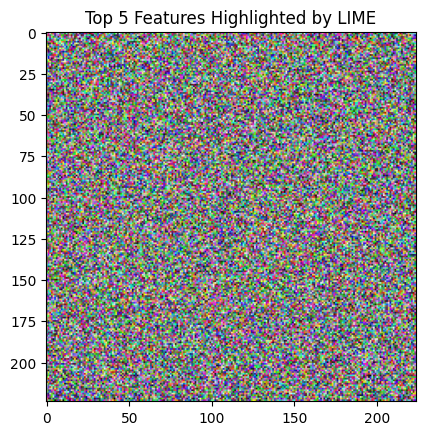

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image

explainer = lime_image.LimeImageExplainer()

example_image, example_label = test_generator[0][0][0], test_generator[0][1][0]

explanation = explainer.explain_instance(
    np.array(example_image).astype('double'),  
    classifier_fn=model.predict,  
    top_labels=1,  
    hide_color=0,
    num_samples=100
)

label = explanation.top_labels[0]
feature_importance = explanation.local_exp[label]  

top_features = sorted(feature_importance, key=lambda x: abs(x[1]), reverse=True)[:5]

total_importance = sum(abs(score) for _, score in feature_importance)
top_features_percentages = [(f"Superpixel {feature}", (score / total_importance) * 100) for feature, score in top_features]

print("Top 5 features with their importance percentages:")
for name, percentage in top_features_percentages:
    print(f"{name}: {percentage:.2f}%")

temp, mask = explanation.get_image_and_mask(
    label, positive_only=True, num_features=5, hide_rest=False
)
plt.imshow(temp)
plt.title("Top 5 Features Highlighted by LIME")
plt.show()


In [ ]:
model.save('VGG.h5')